 # Important Libraries

In [65]:
!pip install -q pycocotools 

In [110]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from pycocotools.coco import COCO
import numpy as np
from PIL import Image
import torchvision
import torchvision.transforms as T
import xml.etree.ElementTree as ET
from torch import nn
from torch.hub import load_state_dict_from_url
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from scipy.optimize import linear_sum_assignment
from collections import defaultdict
import json
import random
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from tqdm import tqdm
import time
from pathlib import Path
import matplotlib.patches as patches
import cv2
from PIL import Image
import torchvision.transforms as T
from torch.autograd import Variable
import torchvision.transforms.functional as F
import random

# Datasets 

## COCO Dataset

In [ ]:
class COCODataset(Dataset):
    def __init__(self, root_dir, annotation_file, transform=None):
        self.root_dir = root_dir
        self.coco = COCO(annotation_file)
        self.transform = transform

         
        self.ids = [img_id for img_id in sorted(self.coco.imgs.keys())
                    if len(self.coco.getAnnIds(imgIds=img_id)) > 0]

         
        categories = self.coco.loadCats(self.coco.getCatIds())
        self.catid2name = {cat['id']: cat['name'] for cat in categories}
        self.catid2name[0] = "background"
        self.num_classes = 91   

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        image_path = os.path.join(self.root_dir, img_info['file_name'])
        image = Image.open(image_path).convert('RGB')

        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        annotations = self.coco.loadAnns(ann_ids)

        boxes = []
        labels = []
        masks = []

        for ann in annotations:
            if 'bbox' in ann:
                x, y, w, h = ann['bbox']
                if w <= 0 or h <= 0:
                    continue
                boxes.append([x, y, x + w, y + h])
                labels.append(ann['category_id'])   

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        if len(masks) > 0:
            masks = torch.as_tensor(np.array(masks), dtype=torch.uint8)
        else:
            masks = torch.zeros((0, img_info['height'], img_info['width']), dtype=torch.uint8)

        image_id = torch.tensor([img_id])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)
        class_names = [self.catid2name.get(int(l), str(l)) for l in labels]

        target = {
            'boxes': boxes,
            'labels': labels,
            'masks': masks,
            'image_id': image_id,
            "class_names": class_names,
            'area': area,
            'iscrowd': iscrowd,
            'orig_size': torch.as_tensor([img_info['height'], img_info['width']])
        }

        if self.transform is not None:
            image, target = self.transform(image, target)

        return image, target


class CustomTransform:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, target):
        for t in self.transforms:
            image = t(image)
        return image, target
def get_coco_transforms(train=False, img_size=640):
    """
    Get the transforms for COCO dataset.
    Args:
        train (bool): Whether it's for training or evaluation.
        img_size (int): Image size to resize to.
    """
    transforms = []
     
     
     
    transforms.append(T.ToTensor())
     
    
    return CustomTransform(transforms)

def get_coco_dataloader(root_dir, annotation_file, batch_size=8, num_workers=4, img_size=640):
    """
    Creates a DataLoader for COCO dataset.
    """
    transform = get_coco_transforms(train=False, img_size=img_size)
    dataset = COCODataset(root_dir, annotation_file, transform=transform)
    
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn
    )
    
    return dataloader

def collate_fn(batch):
    """
    Custom collate function for DataLoader to handle varying sized images and annotations.
    """
    images = []
    targets = []
    for img, target in batch:
        images.append(img)
        targets.append(target)
    
    return images, targets


## Pascal VOC Dataset


In [ ]:
class PascalVOCDataset(Dataset):
    def __init__(self, images_dir, annotations_dir, transform=None):
        self.images_dir = images_dir
        self.annotations_dir = annotations_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]
        self.image_files.sort()
        
        self.catid2name = {0 : "background", 1: 'aeroplane', 2: 'bicycle', 3: 'bird', 4: 'boat', 5: 'bottle',
                        6: 'bus', 7: 'car', 8: 'cat', 9: 'chair', 10: 'cow',
                        11: 'dining table', 12: 'dog', 13: 'horse', 14: 'motorbike', 15: 'person',
                        16: 'potted plant', 17: 'sheep', 18: 'sofa', 19: 'train', 20: 'tv'}
        self.num_classes = len(self.catid2name)
        
        self.class_to_idx = {v: k for k, v in self.catid2name.items()}
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
         
        img_name = self.image_files[idx]
        img_path = os.path.join(self.images_dir, img_name)
        image = Image.open(img_path).convert('RGB')
        
        width, height = image.size
        
        xml_name = os.path.splitext(img_name)[0] + '.xml'
        xml_path = os.path.join(self.annotations_dir, xml_name)
        
        boxes = []
        labels = []
        class_names = []
        tree = ET.parse(xml_path)
        root = tree.getroot()
        
        for obj in root.findall('object'):
            class_name = obj.find('name').text
            if class_name in self.class_to_idx:
                label = self.class_to_idx[class_name]
                class_names.append(class_name)
                
                bbox = obj.find('bndbox')
                x_min = float(bbox.find('xmin').text)
                y_min = float(bbox.find('ymin').text)
                x_max = float(bbox.find('xmax').text)
                y_max = float(bbox.find('ymax').text)
                
                if x_max <= x_min or y_max <= y_min:
                    continue
                    
                boxes.append([x_min, y_min, x_max, y_max])
                labels.append(label)
        
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = 0 
        if len(boxes) > 0 : 
            area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) 
        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)
        
        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': image_id,
            'class_names': class_names,
            'area': area,
            'iscrowd': iscrowd,
            'orig_size': torch.as_tensor([height, width])
        }
        
        if self.transform is not None:
            image, target = self.transform(image, target)
        
        return image, target

def get_pascal_transforms(train=False, img_size=640):

    transforms = []
     
    transforms.append(T.ToTensor())
     
    
    return CustomTransform(transforms)

def get_pascal_dataloader(images_dir, annotations_dir, batch_size=8, num_workers=4, img_size=640):

    transform = get_pascal_transforms(train=False, img_size=img_size)
    dataset = PascalVOCDataset(images_dir, annotations_dir, transform=transform)
    
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn
    )
    
    return dataloader

def collate_fn(batch):
    images = []
    targets = []
    for img, target in batch:
        images.append(img)
        targets.append(target)
    
    return images, targets
def map_coco_to_pascal(coco_label_id):
    coco_to_pascal = {
        1: 15,     # person
        2: 2,      # bicycle
        3: 7,      # car
        4: 14,     # motorcycle → motorbike
        6: 6,      # bus
        8: 4,      # truck → boat (closest moving vehicle)
        9: 4,      # boat
        16: 3,     # bird
        17: 8,     # cat
        18: 12,    # dog
        19: 13,    # horse
        20: 17,    # sheep
        21: 10,    # cow
        62: 9,     # chair
        63: 18,    # couch → sofa
        64: 16,    # potted plant
        65: 18,    # bed → closest to sofa
        67: 11,    # dining table
        72: 20,    # tv
        73: 20,    # laptop → tv (same visual space)
        7: 19,     # train
        5: 1,      # airplane → aeroplane
    }
    return coco_to_pascal.get(coco_label_id, 0)

## COCO Test Dataest

In [69]:
class COCOTestDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.image_ids = list(sorted(os.listdir(data_dir)))

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        image_path = os.path.join(self.data_dir, image_id)
        image = Image.open(image_path).convert("RGB")
        image = F.to_tensor(image)
        return image, image_id
def collate_fn(batch):
    images = []
    targets = []
    for img, target in batch:
        images.append(img)
        targets.append(target)
    
    return images, targets
def get_coco_test_dataloader(data_dir, batch_size=1, num_workers=4, img_size=640):
    transforms = []
    transforms.append(T.ToTensor())
    transform = CustomTransform(transforms)
    
    dataset = COCOTestDataset(data_dir, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, collate_fn=collate_fn)
    
    return dataloader

# Models

## Faster R-CNN

In [70]:
class FasterRCNNModel(nn.Module):

    def __init__(self, num_classes=91, backbone='resnet50', pretrained=True, device='cuda'):

        super(FasterRCNNModel, self).__init__()
        self.device = device
        self.num_classes = num_classes
        self.activation_maps = {}
        
        if backbone == 'resnet50':
            self.model = fasterrcnn_resnet50_fpn(pretrained)            
            # in_features = self.model.roi_heads.box_predictor.cls_score.in_features
            # self.model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
        else:
            raise NotImplementedError(f"Backbone {backbone} not implemented for Faster R-CNN")
            
        self.model.to(device)
        self.model.eval()
            
    def forward(self, images, targets=None):
        images = [img.to(self.device) for img in images]
        if targets is not None:
            targets = [{k: v.to(self.device) if isinstance(v, torch.Tensor) else v 
                       for k, v in t.items()} for t in targets]
            
            loss_dict = self.model(images, targets)
            return loss_dict
        else:
            with torch.no_grad():
                outputs = self.model(images)
            return outputs
    
    def get_feature_maps(self, images, layer_name=None):
        if layer_name is None:
            layer_name = 'backbone.body.layer4' 
        
        images = [img.to(self.device) for img in images]

        feature_maps = {}
        
        def hook_fn(module, input, output):
            feature_maps[layer_name] = output
        
        for name, module in self.model.named_modules():
            if name == layer_name:
                handle = module.register_forward_hook(hook_fn)
                break        
        with torch.no_grad():
            _ = self.model(images)
        handle.remove()
        
        return feature_maps
    def get_logits(self, images):
        self.model.eval()
        images = [img.to(self.device) for img in images]
        with torch.set_grad_enabled(True):
            images, _ = self.model.transform(images)
            features = self.model.backbone(images.tensors)
            proposals, _ = self.model.rpn(images, features)
            box_features = self.model.roi_heads.box_roi_pool(
                features, proposals, images.image_sizes)
            box_features = self.model.roi_heads.box_head(box_features)
            class_logits, _ = self.model.roi_heads.box_predictor(box_features)
            return class_logits, box_features 



# Metrics

In [71]:
def calculate_iou(box_a, box_b):
    x_a = max(box_a[0], box_b[0])
    y_a = max(box_a[1], box_b[1])
    x_b = min(box_a[2], box_b[2])
    y_b = min(box_a[3], box_b[3])    
    inter_area = max(0, x_b - x_a) * max(0, y_b - y_a)    
    box_a_area = (box_a[2] - box_a[0]) * (box_a[3] - box_a[1])
    box_b_area = (box_b[2] - box_b[0]) * (box_b[3] - box_b[1])    
    iou = inter_area / float(box_a_area + box_b_area - inter_area)
    return iou


In [ ]:
def match_detections_to_ground_truth(detections, ground_truths, iou_threshold=0.5, match_method='greedy'):

    matches = []
    unmatched_detections = list(range(len(detections['boxes'])))
    unmatched_ground_truths = list(range(len(ground_truths['boxes'])))
    
    if len(unmatched_detections) == 0 or len(unmatched_ground_truths) == 0:
        return matches, unmatched_detections, unmatched_ground_truths
    
    iou_matrix = torch.zeros((len(detections['boxes']), len(ground_truths['boxes'])))
    for d_idx in unmatched_detections:
        for gt_idx in unmatched_ground_truths:
            if detections['labels'][d_idx] == ground_truths['labels'][gt_idx]:
                iou_matrix[d_idx, gt_idx] = calculate_iou(
                    detections['boxes'][d_idx], 
                    ground_truths['boxes'][gt_idx]
                )
    
     
     
    if match_method == 'greedy':
        while len(unmatched_detections) > 0 and len(unmatched_ground_truths) > 0:
            flat_idx = iou_matrix.flatten().argmax()
            d_idx = flat_idx // len(ground_truths['boxes'])
            gt_idx = flat_idx % len(ground_truths['boxes'])
            
             
            if iou_matrix[d_idx, gt_idx] >= iou_threshold:
                matches.append((d_idx, gt_idx, iou_matrix[d_idx, gt_idx].item()))
                
                 
                unmatched_detections.remove(d_idx)
                unmatched_ground_truths.remove(gt_idx)
                
                 
                iou_matrix[d_idx, :] = 0
                iou_matrix[:, gt_idx] = 0
            else:
                break
    elif match_method == 'hungarian':
        row_ind, col_ind = linear_sum_assignment(-iou_matrix.numpy())
        
        for d_idx, gt_idx in zip(row_ind, col_ind):
            if iou_matrix[d_idx, gt_idx] >= iou_threshold:
                matches.append((d_idx, gt_idx, iou_matrix[d_idx, gt_idx].item()))
                unmatched_detections.remove(d_idx)
                unmatched_ground_truths.remove(gt_idx)
                iou_matrix[d_idx, :] = 0
                iou_matrix[:, gt_idx] = 0
    else:
        raise ValueError(f"Unknown match method: {match_method}")
    
    return matches, unmatched_detections, unmatched_ground_truths

In [73]:
def calculate_precision_recall(matches, num_detections, num_ground_truths):
    if num_detections == 0:
        precision = 1.0 if num_ground_truths == 0 else 0.0
    else:
        precision = len(matches) / num_detections
    
    if num_ground_truths == 0:
        recall = 1.0
    else:
        recall = len(matches) / num_ground_truths
    
    return precision, recall

In [74]:
def calculate_average_precision(precisions, recalls):
    indices = np.argsort(recalls)
    recalls = np.array(recalls)[indices]
    precisions = np.array(precisions)[indices]
    ap = 0
    for t in np.arange(0, 1.1, 0.1):
        if np.sum(recalls >= t) == 0:
            p = 0
        else:
            p = np.max(precisions[recalls >= t])
        ap += p / 11
    
    return ap

In [ ]:
def calculate_mAP(detections_list, ground_truths_list, num_classes, iou_threshold=0.5):
     
    all_detections = [[] for _ in range(num_classes)]
    all_ground_truths = [[] for _ in range(num_classes)]
    
     
    for img_idx, (detections, ground_truths) in enumerate(zip(detections_list, ground_truths_list)):
        boxes = detections['boxes'].cpu().numpy() if isinstance(detections['boxes'], torch.Tensor) else detections['boxes']
        scores = detections['scores'].cpu().numpy() if isinstance(detections['scores'], torch.Tensor) else detections['scores']
        labels = detections['labels'].cpu().numpy() if isinstance(detections['labels'], torch.Tensor) else detections['labels']
        
        gt_boxes = ground_truths['boxes'].cpu().numpy() if isinstance(ground_truths['boxes'], torch.Tensor) else ground_truths['boxes']
        gt_labels = ground_truths['labels'].cpu().numpy() if isinstance(ground_truths['labels'], torch.Tensor) else ground_truths['labels']
        
        for class_id in range(num_classes):
             
            class_detections_indices = np.where(labels == class_id)[0]
            for idx in class_detections_indices:
                all_detections[class_id].append({
                    'image_id': img_idx,
                    'box': boxes[idx],
                    'score': scores[idx]
                })
            
            class_gt_indices = np.where(gt_labels == class_id)[0]
            for idx in class_gt_indices:
                all_ground_truths[class_id].append({
                    'image_id': img_idx,
                    'box': gt_boxes[idx]
                })
    
    average_precisions = {}
    
    for class_id in range(num_classes):
        detections = all_detections[class_id]
        ground_truths = all_ground_truths[class_id]
        
        if len(ground_truths) == 0:
            average_precisions[class_id] = 0.0
            continue
        
        detections.sort(key=lambda x: x['score'], reverse=True)
        
        tp = np.zeros(len(detections))
        fp = np.zeros(len(detections))
        
        gt_by_image = defaultdict(list)
        for gt in ground_truths:
            gt_by_image[gt['image_id']].append(gt)
        
        used_gt = {img_id: [False] * len(gts) for img_id, gts in gt_by_image.items()}
        
        for det_idx, detection in enumerate(detections):
            img_id = detection['image_id']
            det_box = detection['box']
            
            img_gts = gt_by_image.get(img_id, [])
            best_iou = -1
            best_gt_idx = -1
            
            for gt_idx, gt in enumerate(img_gts):
                if used_gt[img_id][gt_idx]:
                    continue
                
                iou = calculate_iou(det_box, gt['box'])
                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = gt_idx
            
            if best_iou >= iou_threshold and best_gt_idx >= 0:
                tp[det_idx] = 1
                used_gt[img_id][best_gt_idx] = True
            else:
                fp[det_idx] = 1
        
        tp_cumsum = np.cumsum(tp)
        fp_cumsum = np.cumsum(fp)
        
        precisions = tp_cumsum / (tp_cumsum + fp_cumsum)
        recalls = tp_cumsum / len(ground_truths)
        
        precisions = np.concatenate(([1], precisions))
        recalls = np.concatenate(([0], recalls))
        
        average_precisions[class_id] = calculate_average_precision(precisions, recalls)
    
    # Calculate mAP
    mean_ap = sum(average_precisions.values()) / len(average_precisions)
    
    return mean_ap, average_precisions


# Utilities

In [ ]:
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = True

def get_device():
    return 'cuda' if torch.cuda.is_available() else 'cpu'

def get_model_size(model):
    param_size = 0
    for param in model.parameters():
        param_size += param.nelement() * param.element_size()
    
    buffer_size = 0
    for buffer in model.buffers():
        buffer_size += buffer.nelement() * buffer.element_size()
    
    size_mb = (param_size + buffer_size) / 1024**2
    return size_mb

def save_results(results, output_path):
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    
    with open(output_path, 'w') as f:
        json.dump(results, f, indent=4)

def plot_comparison(metrics, model_names, metric_name, output_path=None):
    plt.figure(figsize=(10, 6))
    bars = plt.bar(model_names, metrics, color=['skyblue', 'orange', 'green'])
    
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                 f'{height:.4f}', ha='center', va='bottom')
    
    plt.ylabel(metric_name)
    plt.title(f'Comparison of {metric_name} across Models')
    plt.ylim(0, max(metrics) * 1.2)  
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    if output_path:
        plt.savefig(output_path)
    
    plt.close()

def get_inference_time(model, input_tensor, num_iterations=20):
    model.eval()
    device = next(model.parameters()).device
    input_tensor = input_tensor.to(device)
    
    with torch.no_grad():
        for _ in range(10):
            _ = model(input_tensor)
    
    start_time = torch.cuda.Event(enable_timing=True)
    end_time = torch.cuda.Event(enable_timing=True)
    
    times = []
    with torch.no_grad():
        for _ in range(num_iterations):
            start_time.record()
            _ = model(input_tensor)
            end_time.record()
            torch.cuda.synchronize()
            times.append(start_time.elapsed_time(end_time))
    
    return sum(times) / len(times) 


# Visualization

In [77]:
class FeatureExtractor():
    def __init__(self, model, target_layers):
        self.model = model
        self.target_layers = target_layers
        self.gradients = {}
        self.features = {}
        self._register_hooks()

    def _register_hooks(self):
        for name, module in self.model.named_modules():
            if name in self.target_layers:
                module.register_forward_hook(self._forward_hook(name))
                module.register_full_backward_hook(self._backward_hook(name))

    def _forward_hook(self, name):
        def hook(module, input, output):
            self.features[name] = output
        return hook

    def _backward_hook(self, name):
        def hook(module, grad_input, grad_output):
            self.gradients[name] = grad_output[0]
        return hook

    def __call__(self, x):
        self.features = {}
        self.gradients = {}
        _ = self.model(x)
        return self.features, self.gradients


In [ ]:
class GradCAM:
    def __init__(self, model_wrapper, target_layer_names, device):
        self.model_wrapper = model_wrapper  
        self.device = device
        self.model = model_wrapper.model
        self.extractor = FeatureExtractor(self.model, target_layer_names)

    def __call__(self, input_img, class_index=1):  
        input_img = input_img.to(self.device)
        input_img.requires_grad_()

        self.model.eval()

        features, _ = self.extractor([input_img])
        logits, _ = self.model_wrapper.get_logits([input_img])
        score = logits[0, class_index] 

        self.model.zero_grad()
        score.backward()

        target_layer = list(features.keys())[0]
        grad = self.extractor.gradients[target_layer][0].cpu().numpy()
        fmap = features[target_layer][0].detach().cpu().numpy()

        weights = np.mean(grad, axis=(1, 2))
        cam = np.zeros(fmap.shape[1:], dtype=np.float32)

        for i, w in enumerate(weights):
            cam += w * fmap[i, :, :]

        cam = np.maximum(cam, 0)

        cam = cv2.resize(cam, (input_img.shape[2], input_img.shape[1]))
        cam = (cam - np.min(cam)) / (np.max(cam) - np.min(cam) + 1e-8)
        return cam, score.detach().cpu().item()


In [ ]:
def visualize_detection(image, boxes, scores, labels, class_names, score_threshold=0.5, save_path=None):
    vis_image = F.to_pil_image(image.copy())
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(vis_image)
    colors = plt.cm.hsv(np.linspace(0, 1, len(class_names)))
    
    for box, score, label in zip(boxes, scores, labels):
        if score < score_threshold:
            continue
        if label == 0:
            continue 
            
        color = colors[label % len(colors)]
        
        label = label.item()
        x1, y1, x2, y2 = box
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        class_name = class_names[label] if label in class_names.keys() else f"Class {label}"
        ax.text(x1, y1-5, f"{class_name} {score:.2f}", color=color, fontsize=10, backgroundcolor='white')
    ax.set_xticks([])
    ax.set_yticks([])
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0.0)
    plt.show()

    
    fig.canvas.draw()
    vis_image = np.array(fig.canvas.renderer.buffer_rgba())
    
    return vis_image

def visualize_feature_maps(feature_maps, num_maps=16, save_path=None):
    if isinstance(feature_maps, torch.Tensor):
        feature_maps = feature_maps.detach().cpu().numpy()
    
    if feature_maps.ndim == 4:
        feature_maps = feature_maps[0]
    
    num_channels = feature_maps.shape[0]
    num_maps = min(num_maps, num_channels)
    grid_size = int(np.ceil(np.sqrt(num_maps)))
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    if isinstance(axes, np.ndarray):
        axes = axes.flatten()
    else:
        axes = [axes]
    for i in range(num_maps):
        feature_map = feature_maps[i]
        if feature_map.ndim != 2:
            feature_map = feature_map.squeeze()
        feature_map = (feature_map - feature_map.min()) / (feature_map.max() - feature_map.min() + 1e-8)
        axes[i].imshow(feature_map, cmap='viridis')
        axes[i].set_title(f"Channel {i}")
        axes[i].axis('off')
    for i in range(num_maps, len(axes)):
        fig.delaxes(axes[i])
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()
    fig.canvas.draw()
    vis_image = np.array(fig.canvas.renderer.buffer_rgba())
    return vis_image

In [ ]:
def show_case(case_indices, dataloader, model, device, case_type="success", max_cases=5):
    print(f"Visualizing {case_type} cases...")
    shown = 0
    for (batch_idx, img_idx, det_idx) in case_indices:
        
        for i, (images, targets) in enumerate(dataloader):
            if i == batch_idx:
                image = images[img_idx].to(device)
                target = targets[img_idx]
                with torch.no_grad():
                    output = model([image])[0]
                img_np = image.cpu().permute(1, 2, 0).numpy()
                img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
                boxes = output['boxes'].cpu().numpy()
                scores = output['scores'].cpu().numpy()
                labels = output['labels'].cpu().numpy()
                plt.figure(figsize=(10, 8))
                plt.imshow(img_np)
                box = boxes[det_idx]
                score = scores[det_idx]
                label = labels[det_idx]
                x1, y1, x2, y2 = box
                rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='lime' if case_type=="success" else 'red', facecolor='none')
                plt.gca().add_patch(rect)
                class_name = dataloader.dataset.catid2name.get(int(label), str(label))
                plt.title(f"{case_type.title()} Case: {class_name} ({score:.2f})")
                plt.axis('off')
                plt.show()
                shown += 1
                break
        if shown >= max_cases:
            break


In [81]:
def visualize_sample(images, targets):
    i = random.randint(0, len(images) - 1)
    image = images[i]
    target = targets[i]
    image_vis = F.to_pil_image(image)
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image_vis)
    boxes = target['boxes']
    labels = target['labels']
    class_names = target['class_names']
    for j, box in enumerate(boxes):
        x_min, y_min, x_max, y_max = box
        width, height = x_max - x_min, y_max - y_min
        label = str(class_names[j])

        rect = patches.Rectangle((x_min, y_min), width, height,
                                 linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min, label, fontsize=12,
                bbox=dict(facecolor='yellow', alpha=0.5))

    ax.axis('off')
    plt.tight_layout()
    plt.show()


In [ ]:
def visualize_detection_samples(num_samples, dataloader, model, model_name = "faster_rcnn", vis_dir='./'):
    samples = []
    for batch_idx, batch in enumerate(dataloader):
        if batch_idx >= 3:
            break
        samples.append(batch)
    model_vis_dir = os.path.join(vis_dir, model_name)
    os.makedirs(model_vis_dir, exist_ok=True)
    model.eval()
    
    for batch_idx, batch in enumerate(samples):
        images, image_ids = batch
        if isinstance(images, list):
            images = [img.to(device) for img in images]
        else:
            images = images.to(device)
        
        with torch.no_grad():
            outputs = model(images)
        for i, output in enumerate(outputs):
            if batch_idx* len(batch)+i == num_samples:
                return
            if isinstance(images, list):
                image = images[i].cpu()
            else:
                image = images[i].cpu()
            if isinstance(image, torch.Tensor):
                if image.max() <= 1.0:
                    image = image * 255
                image = image.permute(1, 2, 0).numpy().astype('uint8')
            
            if hasattr(output, 'keys') and 'boxes' in output and 'labels' in output and 'scores' in output:
                boxes = output['boxes'].cpu().numpy()
                scores = output['scores'].cpu().numpy()
                labels = output['labels'].cpu().numpy()
            mask = scores >= 0.5
            boxes = boxes[mask]
            scores = scores[mask]
            labels = labels[mask]
            if isinstance (dataloader.dataset, PascalVOCDataset):
                labels = np.array([map_coco_to_pascal(label) for label in labels])
            class_names = dataloader.dataset.catid2name if not isinstance(dataloader.dataset, COCOTestDataset) else coco_dataloader.dataset.catid2name
            vis_image = visualize_detection(
                image=image,
                boxes=boxes,
                scores=scores,
                labels=labels,
                class_names=class_names,
                score_threshold=0.5,
                save_path=os.path.join(model_vis_dir, f'sample_{batch_idx}_{i}.png')
            )
            

# Evaluation

In [ ]:
def evaluate_model(model, dataloader, device, iou_threshold=0.5, conf_threshold=0.5, dataset = "COCO"):
    model.eval()
    model.to(device)
    
    all_detections = []
    all_ground_truths = []
    
    if len(dataloader) > 0:
        sample_batch = next(iter(dataloader))
        sample_images = sample_batch[0][0].unsqueeze(0)
        sample_images = sample_images.to(device)
        inference_time = get_inference_time(model, sample_images, num_iterations=50)
    else:
        inference_time = 0.0
    print(f"Infernece time for one image is {inference_time}")
    print(f"Running evaluation with IoU threshold: {iou_threshold}")
    
    success_cases = []
    failure_cases = []
    
    for batch_idx, batch in enumerate(tqdm(dataloader, desc="Evaluating")):
        images, targets = batch
        
        if isinstance(images, list):
            images = [img.to(device) for img in images]
        else:
            images = images.to(device)
        
        with torch.no_grad():
            outputs = model(images)
        for i, output in enumerate(outputs):
            boxes = output['boxes'].cpu().numpy()
            scores = output['scores'].cpu().numpy()
            labels = output['labels'].cpu().numpy()            
            mask = scores >= conf_threshold
            boxes = boxes[mask]
            scores = scores[mask]
            labels = labels[mask]
            if dataset == "PASCAL":
                labels = np.array([map_coco_to_pascal(label) for label in labels])

            if isinstance(targets, list):
                target = targets[i]
            else:
                target = targets[i:i+1]
            
            if hasattr(target, 'keys') and 'boxes' in target and 'labels' in target:
                gt_boxes = target['boxes'].cpu().numpy()
                gt_labels = target['labels'].cpu().numpy()
            elif isinstance(target, dict):
                gt_boxes = target.get('boxes', np.array([])).cpu().numpy()
                gt_labels = target.get('labels', np.array([])).cpu().numpy()
            all_detections.append({
                'boxes': boxes,
                'scores': scores,
                'labels': labels
            })
            
            all_ground_truths.append({
                'boxes': gt_boxes,
                'labels': gt_labels
            })
            
            if len(boxes) > 0 and len(gt_boxes) > 0:
                
                best_ious = []
                for box in boxes:
                    ious = [calculate_iou(box, gt_box) for gt_box in gt_boxes]
                    best_iou = max(ious) if ious else 0
                    best_ious.append(best_iou)
                
                for j, (box, score, label, iou) in enumerate(zip(boxes, scores, labels, best_ious)):
                    if iou > 0.75 and score > 0.8:
                        success_cases.append((batch_idx, i, j))
                
                for j, (box, score, label, iou) in enumerate(zip(boxes, scores, labels, best_ious)):
                    if iou < 0.3 and score > 0.7:
                        failure_cases.append((batch_idx, i, j))
    
    # Calculate mAP
    mAP = calculate_mAP(all_detections, all_ground_truths, num_classes = model.num_classes , iou_threshold=iou_threshold)
    
    # Calculate average IoU
    total_iou = 0
    total_detections = 0
    
    for dets, gts in zip(all_detections, all_ground_truths):
        det_boxes = dets['boxes']
        gt_boxes = gts['boxes']
        
        if len(det_boxes) > 0 and len(gt_boxes) > 0:
            # For each detection, calculate IoU with best matching ground truth
            for det_box in det_boxes:
                ious = [calculate_iou(det_box, gt_box) for gt_box in gt_boxes]
                if ious:
                    total_iou += max(ious)
                    total_detections += 1
    
    avg_iou = total_iou / total_detections if total_detections > 0 else 0
    
    results = {
        'mAP': float(mAP[0]),
        # 'average_precisions':mAP[1],
        'avg_IoU': float(avg_iou),
        'inference_time_ms': float(inference_time),
        'success_cases': success_cases[:10],  
        'failure_cases': failure_cases[:10],  
    }
    
    return results

# Configuration

In [ ]:
file = '/kaggle/input/'
PROJECT_ROOT = Path(os.path.abspath(os.path.dirname(file)))

OUTPUT_ROOT = Path(os.path.abspath(os.path.dirname('kaggle/working')))
DATA_DIR = PROJECT_ROOT
OUTPUT_DIR = OUTPUT_ROOT / "outputs"
VIS_DIR = os.path.join(OUTPUT_DIR, 'visualizations')
os.makedirs(VIS_DIR, exist_ok=True)
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Dataset configurations
COCO_ROOT = DATA_DIR / "coco-2017-dataset/coco2017/"
PASCAL_ROOT = DATA_DIR / "pascal-voc-2012/"

# COCO 2017 dataset
COCO_VAL_IMAGES = COCO_ROOT / "val2017"
COCO_VAL_ANNOTATIONS = COCO_ROOT / "annotations/instances_val2017.json"
COCO_TEST_IMAGES = COCO_ROOT / "test2017"  
# Pascal VOC dataset
PASCAL_VAL_IMAGES = PASCAL_ROOT / "VOC2012/JPEGImages/"
PASCAL_VAL_ANNOTATIONS = PASCAL_ROOT / "VOC2012/Annotations"

# Evaluation parameters
SEED = 42
BATCH_SIZE = 8
NUM_WORKERS = 4
DEVICE = "cuda" 
CONFIDENCE_THRESHOLD = 0.5
IOU_THRESHOLD = 0.5
MAX_DETECTIONS = 100
IMAGE_SIZE = 640  # Input image size for models



In [85]:
set_seed(SEED)
device = get_device()
print(f"Using device: {device}")

Using device: cuda


## COCO Evaluation

In [86]:
coco_dataloader = get_coco_dataloader(
    root_dir= COCO_VAL_IMAGES,
    annotation_file=COCO_VAL_ANNOTATIONS,
    batch_size=BATCH_SIZE,
    img_size=IMAGE_SIZE,
    num_workers=NUM_WORKERS,
)


loading annotations into memory...
Done (t=0.73s)
creating index...
index created!


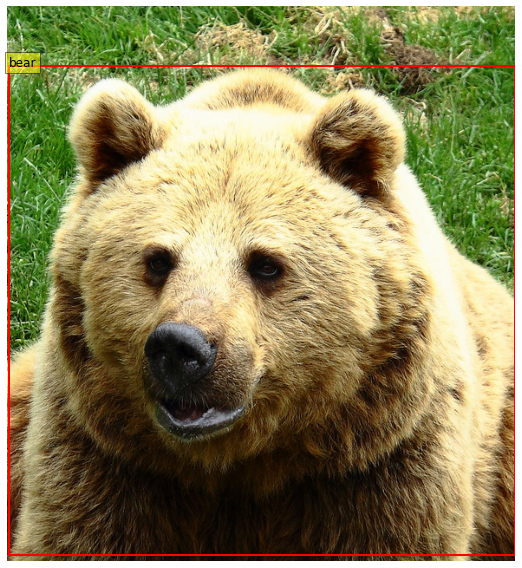

In [87]:
images, targets = next(iter(coco_dataloader))
visualize_sample(images, targets)

In [88]:
model = FasterRCNNModel()
model_size = get_model_size(model)
print(f"size: {model_size:.2f} MB")

size: 159.69 MB


In [89]:
results = evaluate_model(
    model=model,
    dataloader=coco_dataloader,
    device=device,
    iou_threshold=0.5,
    conf_threshold=0.6
)

result_path = Path(OUTPUT_DIR) / f"faster_rcnn_coco_results.json"
save_results(results, result_path)
        

Infernece time for one image is 124.78045333862305
Running evaluation with IoU threshold: 0.5


Evaluating: 100%|██████████| 619/619 [19:51<00:00,  1.92s/it]


In [90]:
results

{'mAP': 0.44691587072127736,
 'avg_IoU': 0.5807674073055251,
 'inference_time_ms': 124.78045333862305,
 'success_cases': [(0, 0, 0),
  (0, 0, 2),
  (0, 0, 5),
  (0, 0, 9),
  (0, 0, 11),
  (0, 0, 12),
  (0, 0, 15),
  (0, 1, 0),
  (0, 2, 0),
  (0, 2, 1)],
 'failure_cases': [(0, 0, 7),
  (0, 0, 8),
  (0, 0, 10),
  (0, 0, 13),
  (0, 0, 14),
  (0, 0, 18),
  (0, 2, 4),
  (0, 2, 6),
  (0, 2, 7),
  (0, 2, 8)]}

## Visualize some sample detections

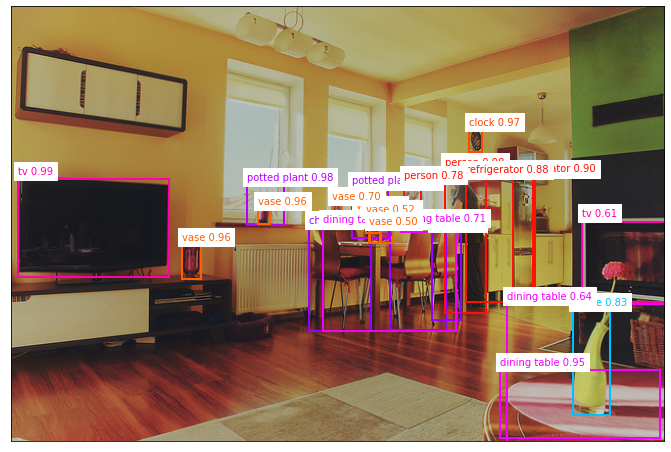

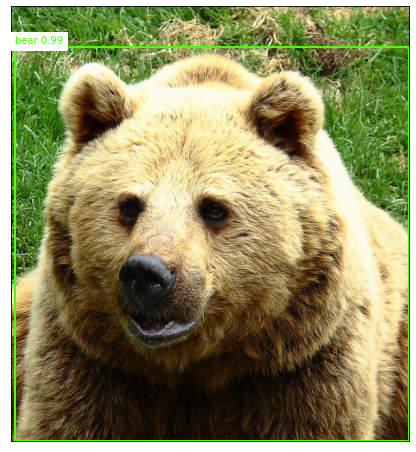

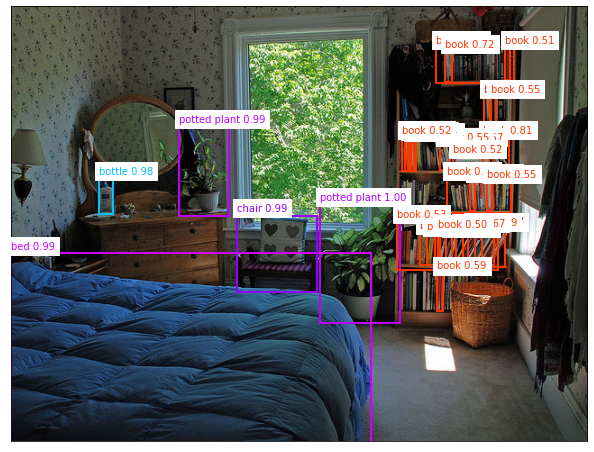

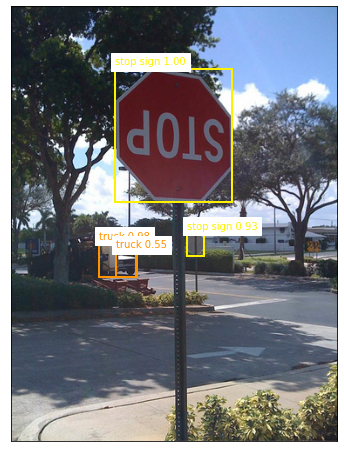

In [91]:
visualize_detection_samples(4, coco_dataloader, model, model_name = "faster_rcnn_coco_val", vis_dir=VIS_DIR)

Visualizing success cases...


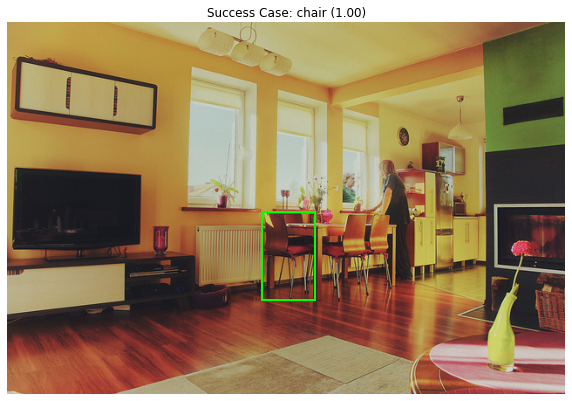

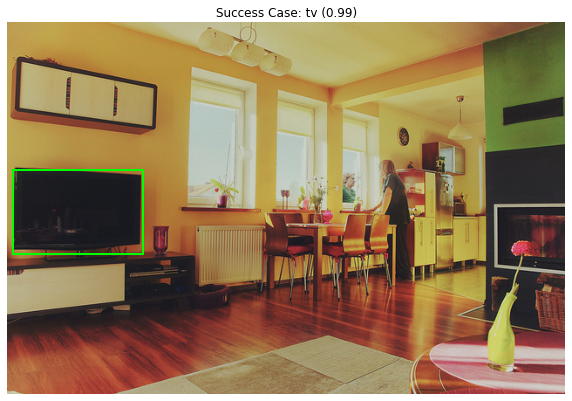

Visualizing failure cases...


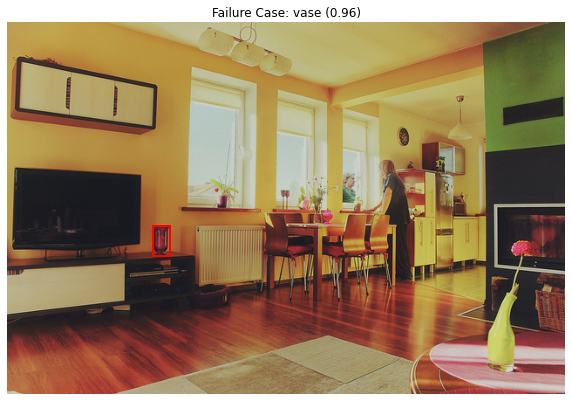

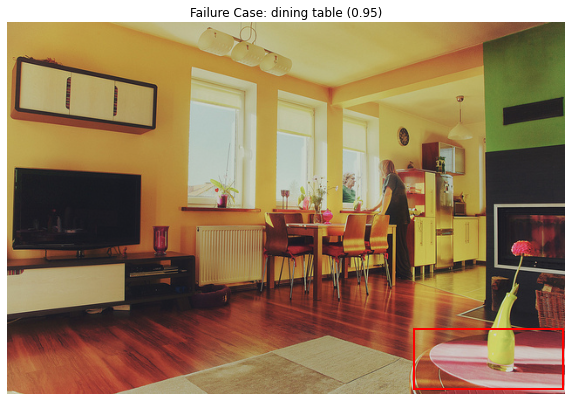

In [92]:
show_case(results['success_cases'], coco_dataloader, model, device, case_type="success", max_cases=2)
show_case(results['failure_cases'], coco_dataloader, model, device, case_type="failure", max_cases=2)

# Pascal Evaluation

In [93]:
pascal_dataloader = get_pascal_dataloader(
    images_dir=PASCAL_VAL_IMAGES,
    annotations_dir=PASCAL_VAL_ANNOTATIONS,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    img_size=IMAGE_SIZE,
)

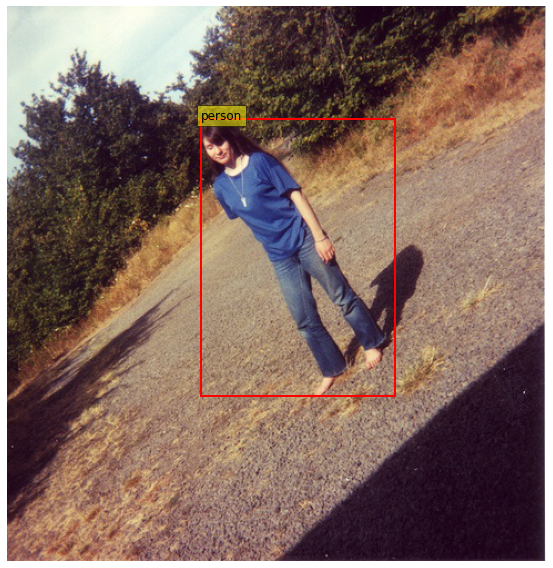

In [94]:
images, targets = next(iter(pascal_dataloader))
visualize_sample(images, targets)

In [95]:
pascal_model = FasterRCNNModel(num_classes=21)

In [96]:
results = evaluate_model(
    model=pascal_model,
    dataloader=pascal_dataloader,
    device=device,
    iou_threshold=0.5,
    conf_threshold=0.6,
    dataset= "PASCAL"
)

result_path = Path(OUTPUT_DIR) / f"faster_rcnn_pascal_results.json"
save_results(results, result_path)

Infernece time for one image is 101.10549880981445
Running evaluation with IoU threshold: 0.5


Evaluating: 100%|██████████| 2141/2141 [53:51<00:00,  1.51s/it] 


In [97]:
results

{'mAP': 0.4871609316888365,
 'avg_IoU': 0.3528532006969824,
 'inference_time_ms': 101.10549880981445,
 'success_cases': [(0, 0, 0),
  (0, 1, 0),
  (0, 1, 3),
  (0, 2, 0),
  (0, 2, 3),
  (0, 4, 0),
  (0, 4, 1),
  (0, 5, 0),
  (0, 5, 3),
  (0, 6, 0)],
 'failure_cases': [(0, 1, 4),
  (0, 1, 7),
  (0, 2, 2),
  (0, 2, 5),
  (0, 2, 6),
  (0, 5, 2),
  (0, 5, 4),
  (0, 5, 5),
  (0, 5, 6),
  (0, 6, 1)]}

## Visualize some predictions

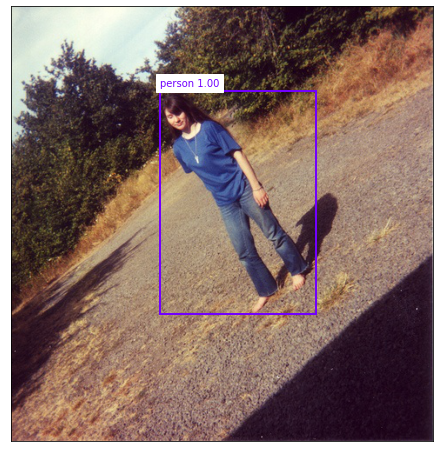

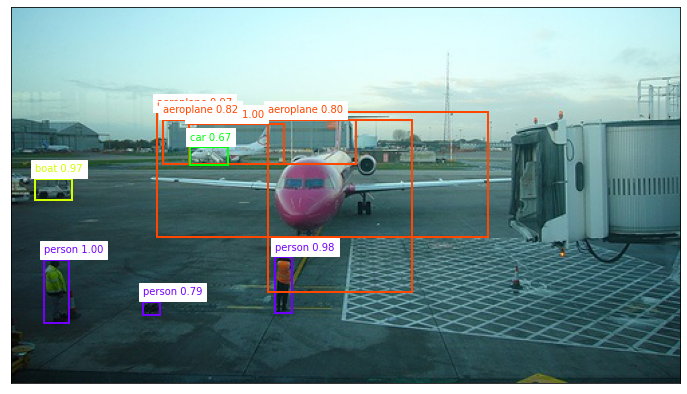

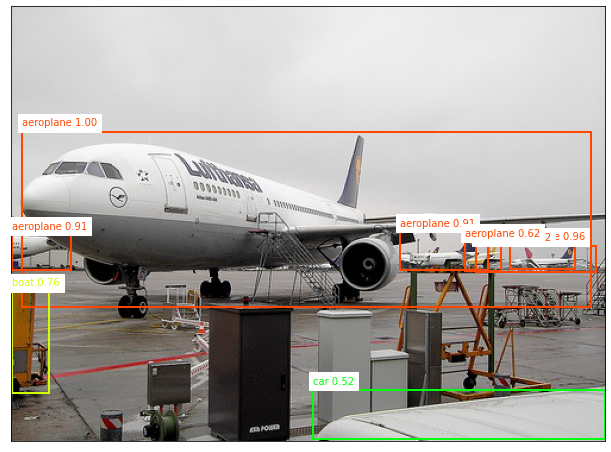

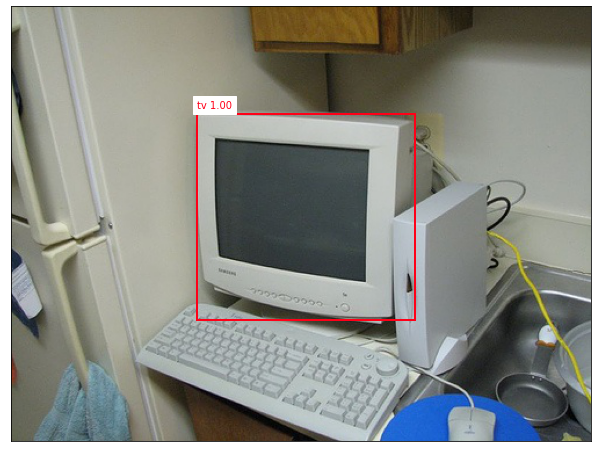

In [98]:
visualize_detection_samples(4, pascal_dataloader, pascal_model, model_name = "faster_rcnn_pascal_val", vis_dir=VIS_DIR)

Visualizing success cases...


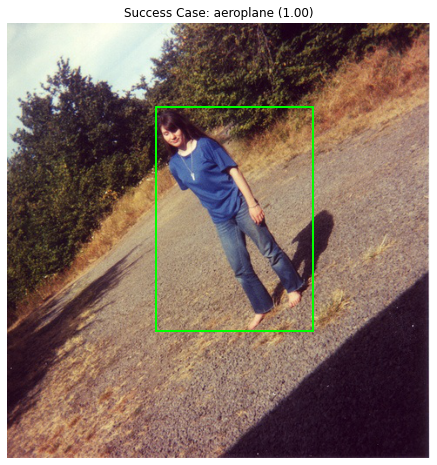

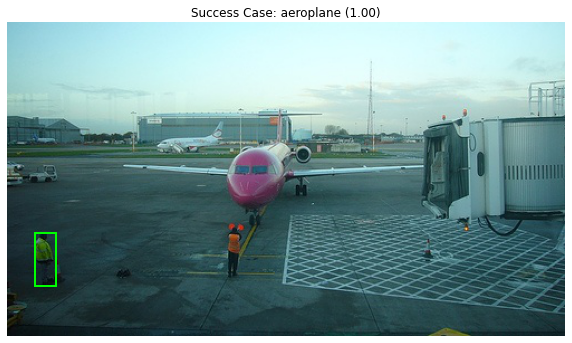

Visualizing failure cases...


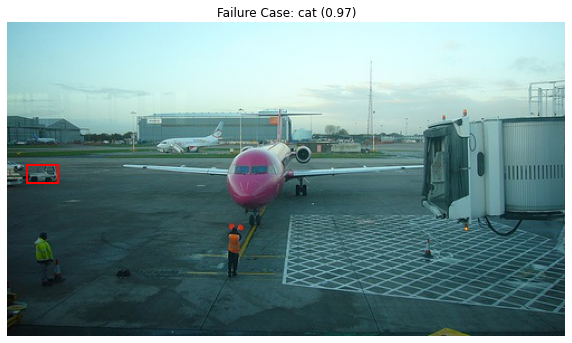

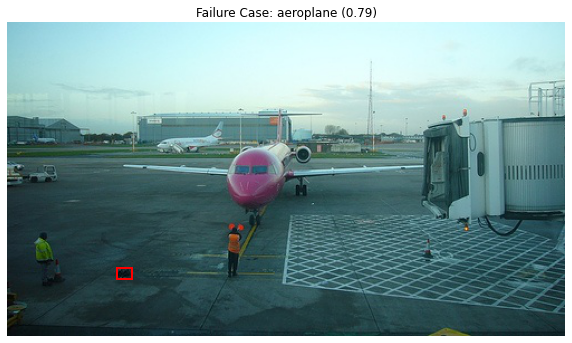

In [99]:
show_case(results['success_cases'], pascal_dataloader, model, device, case_type="success", max_cases=2)
show_case(results['failure_cases'], pascal_dataloader, model, device, case_type="failure", max_cases=2)

# COCO Test

In [100]:
coco_test_dataloader = get_coco_test_dataloader(
    data_dir=COCO_TEST_IMAGES,
    batch_size=BATCH_SIZE,
    num_workers=1,
    img_size=IMAGE_SIZE
)

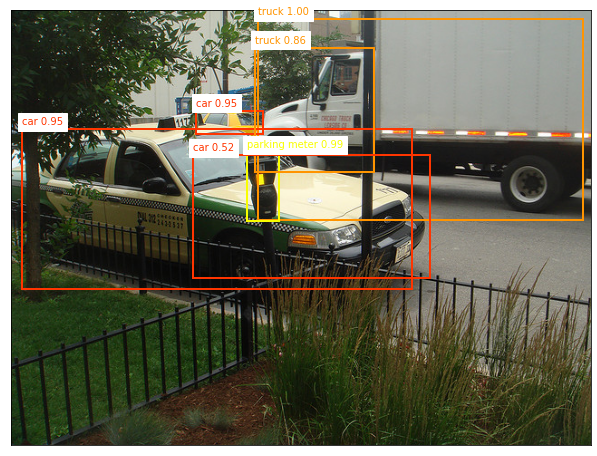

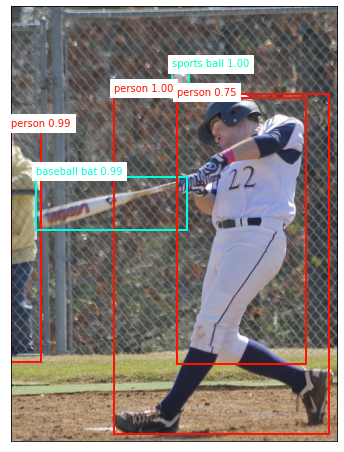

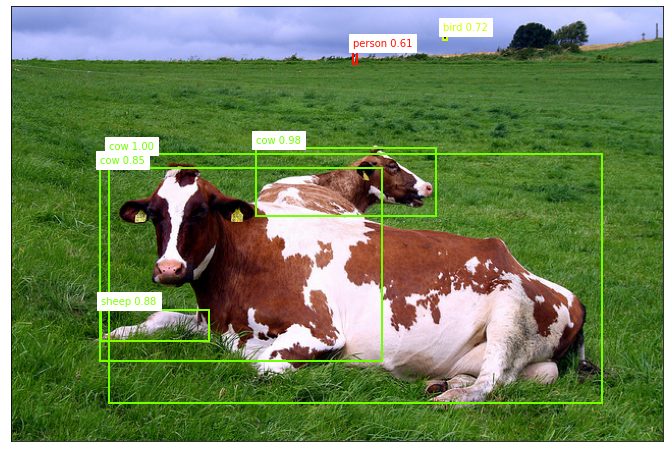

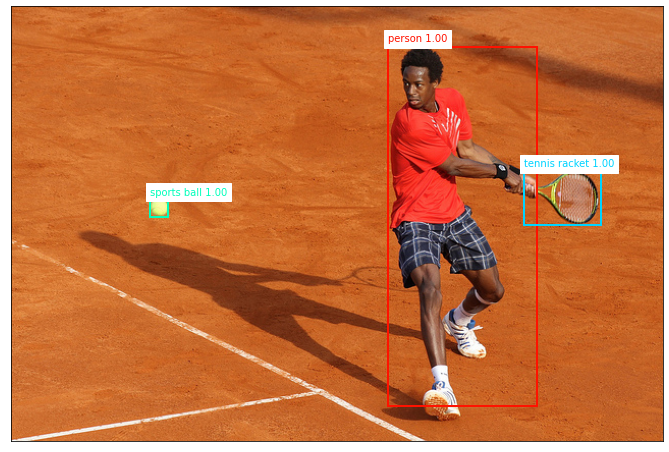

In [101]:
visualize_detection_samples(4, coco_test_dataloader, model, model_name = "faster_rcnn_coco_test", vis_dir=VIS_DIR)

# Bonus

In [102]:
model

FasterRCNNModel(
  (model): FasterRCNN(
    (transform): GeneralizedRCNNTransform(
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        Resize(min_size=(800,), max_size=1333, mode='bilinear')
    )
    (backbone): BackboneWithFPN(
      (body): IntermediateLayerGetter(
        (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (bn1): FrozenBatchNorm2d(64, eps=0.0)
        (relu): ReLU(inplace=True)
        (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (layer1): Sequential(
          (0): Bottleneck(
            (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn1): FrozenBatchNorm2d(64, eps=0.0)
            (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn2): FrozenBatchNorm2d(64, eps=0.0)
            (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          


Extracting feature maps...


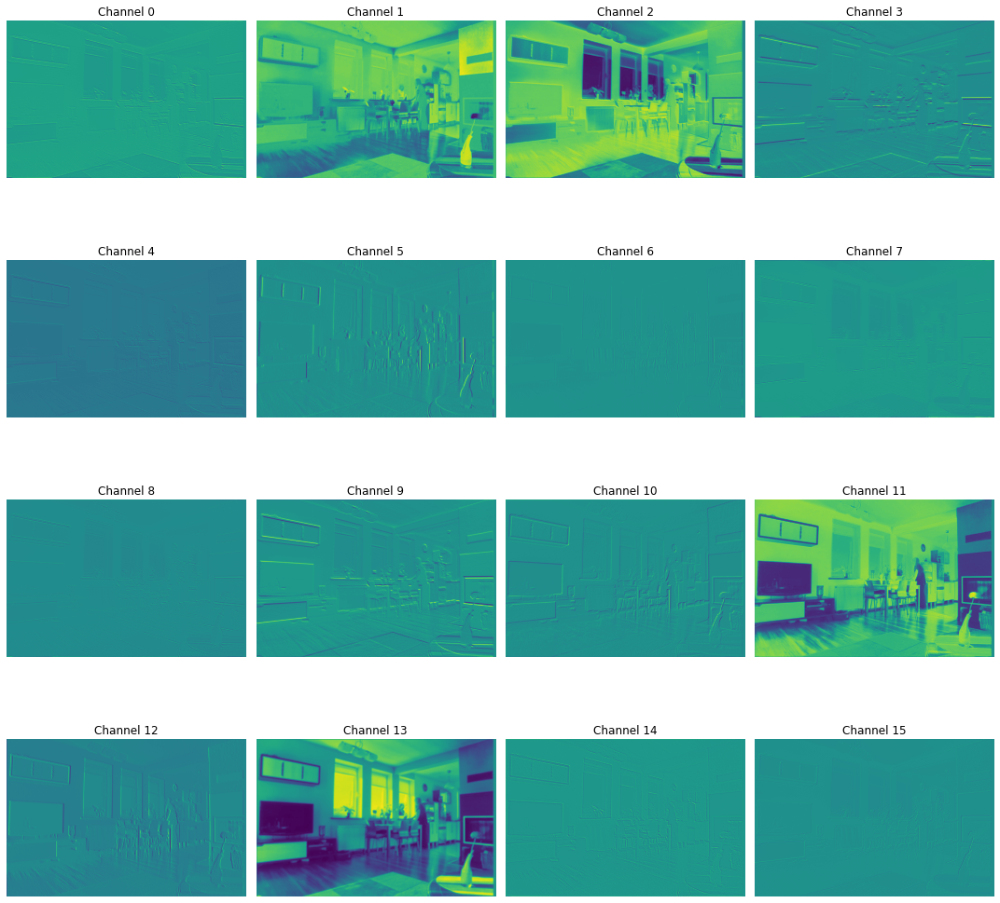

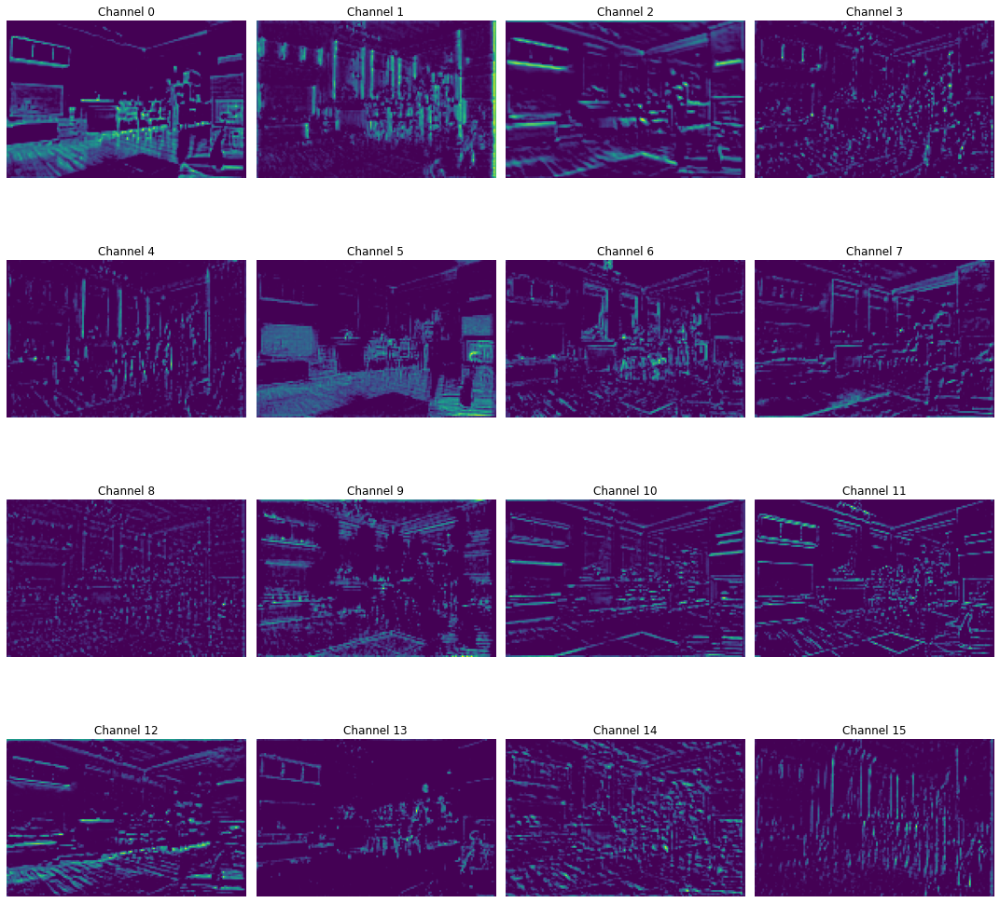

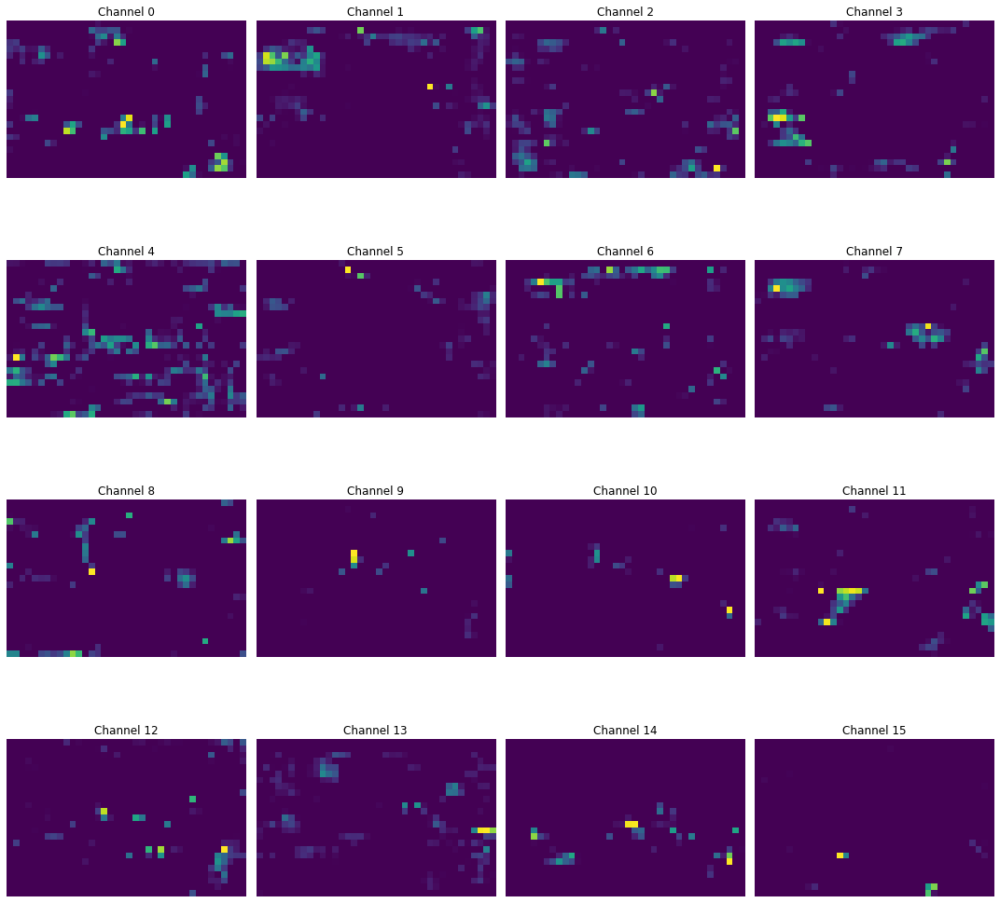

In [103]:
print("\nExtracting feature maps...")
feature_maps_dir = os.path.join(OUTPUT_DIR, 'feature_maps')
os.makedirs(feature_maps_dir, exist_ok=True)

# Get a sample batch
sample_batch = next(iter(coco_dataloader))
sample_images, _ = sample_batch
model_feature_dir = os.path.join(feature_maps_dir, 'faster_rcnn')
os.makedirs(model_feature_dir, exist_ok=True)
target_layers = ['backbone.body.conv1', 'backbone.body.layer2', 'backbone.body.layer4']
for layer_name in target_layers:
    try:
        if isinstance(sample_images, list):
            sample_image = sample_images[0].to(device).unsqueeze(0)
        else:
            sample_image = sample_images[0].to(device).unsqueeze(0)
        with torch.no_grad():
            features = model.get_feature_maps(sample_image, layer_name)
            # print(features[layer_name].shape)
            visualize_feature_maps(
                feature_maps=features[layer_name],
                num_maps=16,
                save_path=os.path.join(model_feature_dir, f'{layer_name.replace(".", "_")}_features.png')
            )
    except Exception as e:
        print(f"Error extracting feature maps for faster_rcnn, layer {layer_name}: {e}")


Generating GradCAM visualizations...


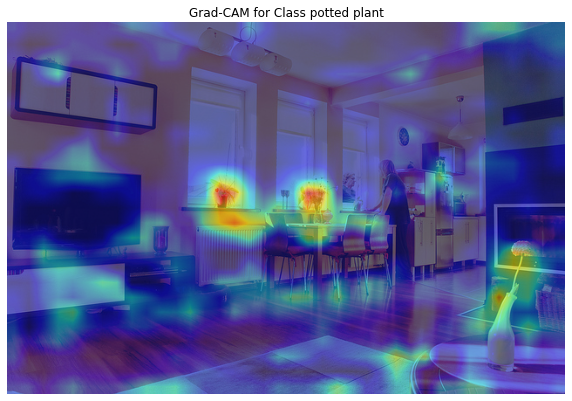

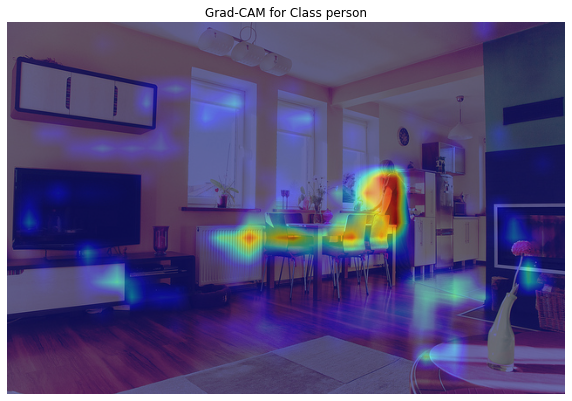

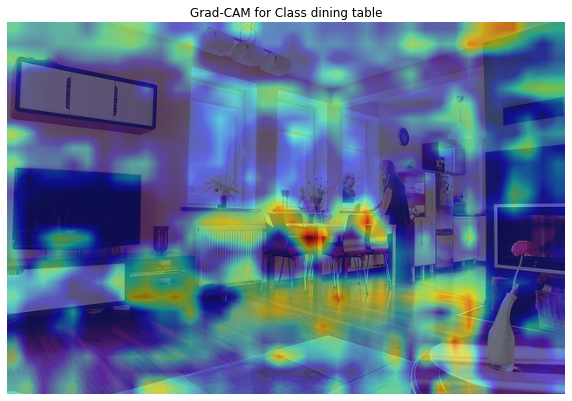

In [ ]:
print("\nGenerating GradCAM visualizations...")

gradcam_dir = os.path.join(OUTPUT_DIR, 'gradcam')
os.makedirs(gradcam_dir, exist_ok=True)

# Sample image
sample_batch = next(iter(coco_dataloader))
sample_images, _ = sample_batch
sample_image = sample_images[0].to(device)

output = model(sample_image.unsqueeze(0))
predicted_class = list(set(output[0]['labels'].detach().cpu().numpy()))[:3]

img_np = sample_image.permute(1, 2, 0).cpu().numpy()
img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

model_gradcam_dir = os.path.join(gradcam_dir, 'faster_rcnn')
os.makedirs(model_gradcam_dir, exist_ok=True)
target_layers = ['backbone.body.layer4']
grad_cam = GradCAM(model, target_layer_names=target_layers, device=device)

for ii in predicted_class:
    cam, output = grad_cam(sample_image, ii)
    plt.figure(figsize=(10, 10))
    plt.imshow(img_np)
    plt.imshow(cam, cmap='jet', alpha=0.5)
    plt.title(f"Grad-CAM for Class {coco_dataloader.dataset.catid2name[ii]}")
    plt.axis('off')
    plt.savefig(os.path.join(model_gradcam_dir, f'gradcam_{ii}.png'))
    plt.show()


# DETR Model

In [ ]:
class DETRModel(nn.Module):
    def __init__(self, num_classes=91, version='detr_resnet50', pretrained=True, device='cuda'):
        super(DETRModel, self).__init__()
        self.device = device
        self.num_classes = num_classes
        if version == 'detr_resnet50':
            self.model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=pretrained)
        elif version == 'detr_resnet101':
            self.model = torch.hub.load('facebookresearch/detr', 'detr_resnet101', pretrained=pretrained)
        else:
            raise ValueError(f"Invalid DETR version: {version}")
        self.model.to(device)
        self.model.eval()
    
    def forward(self, images, targets=None):
        with torch.no_grad():
            outputs = self.model(images)
        processed_outputs = []
        for i in range(len(outputs['pred_logits'])):
             
            logits = outputs['pred_logits'][i]
            boxes = outputs['pred_boxes'][i]
            probs = logits.softmax(-1)
            scores, labels = probs[:, :-1].max(dim=1)
            if isinstance(images, list):
                img_h, img_w = images[i].shape[1:]
            else:
                img_h, img_w = images[i].shape[1:]
            
            scaled_boxes = torch.zeros_like(boxes)
            scaled_boxes[:, 0] = boxes[:, 0] * img_w
            scaled_boxes[:, 1] = boxes[:, 1] * img_h
            scaled_boxes[:, 2] = boxes[:, 2] * img_w
            scaled_boxes[:, 3] = boxes[:, 3] * img_h
            box_cxcywh = scaled_boxes
            x_c, y_c, w, h = box_cxcywh.unbind(1)
            b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
                 (x_c + 0.5 * w), (y_c + 0.5 * h)]
            box_xyxy = torch.stack(b, dim=1)
            keep = scores > 0.7
            box_xyxy = box_xyxy[keep]
            labels = labels[keep]
            scores = scores[keep]
            
            result = {
                'boxes': box_xyxy,
                'scores': scores,
                'labels': labels
            }
            processed_outputs.append(result)
        
        return processed_outputs


In [106]:
detr = DETRModel()
model_size = get_model_size(model)
print(f"size: {model_size:.2f} MB")

Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main


size: 159.69 MB


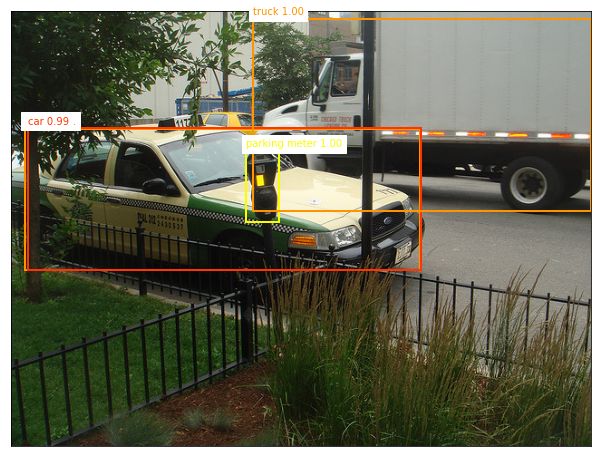

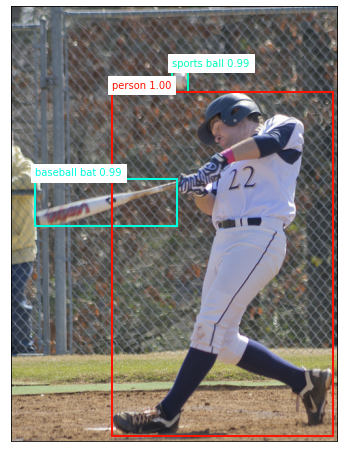

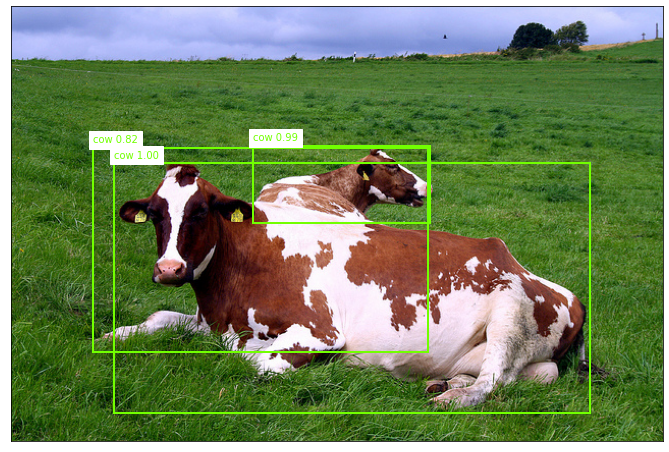

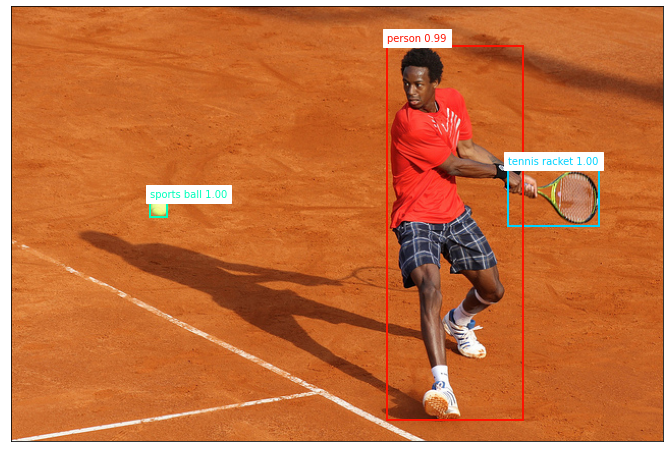

In [107]:
visualize_detection_samples(4, coco_test_dataloader, detr, model_name = "faster_rcnn_coco_test", vis_dir=VIS_DIR)